# Installation

In [1]:
! pip install dash scikit-learn seaborn pandas pillow

  Using cached dash-2.18.2-py3-none-any.whl.metadata (10 kB)
  Using cached flask-3.0.3-py3-none-any.whl.metadata (3.2 kB)
  Using cached werkzeug-3.0.6-py3-none-any.whl.metadata (3.7 kB)
  Using cached plotly-5.24.1-py3-none-any.whl.metadata (7.3 kB)
  Using cached dash_html_components-2.0.0-py3-none-any.whl.metadata (3.8 kB)
  Using cached dash_core_components-2.0.0-py3-none-any.whl.metadata (2.9 kB)
  Using cached dash_table-5.0.0-py3-none-any.whl.metadata (2.4 kB)
  Using cached retrying-1.3.4-py3-none-any.whl.metadata (6.9 kB)
  Using cached joblib-1.4.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached threadpoolctl-3.5.0-py3-none-any.whl.metadata (13 kB)
  Using cached itsdangerous-2.2.0-py3-none-any.whl.metadata (1.9 kB)
Using cached dash-2.18.2-py3-none-any.whl (7.8 MB)
Using cached dash_core_components-2.0.0-py3-none-any.whl (3.8 kB)
Using cached dash_html_components-2.0.0-py3-none-any.whl (4.1 kB)
Using cached dash_table-5.0.0-py3-none-any.whl (3.9 kB)
   ━━━━━━━━━━━━━━━━━━━

# Analysis Points
1. class-wise anomaly bbox analysis 
2. object counts to env conditions
3. object counts to weather conditions
4. anomalies on env and weather conditions

# Dataset Overview
Load and inspect the dataset to understand its structure and components.

In [2]:
import json
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
with open("val.json", "r") as f:
    data = json.load(f)

# Dataset size
print(f"Number of images in the dataset: {len(data)}")

# Inspect a single record
print(data[0])  # Shows the structure of one annotated image


Number of images in the dataset: 10000
{'name': 'b1c66a42-6f7d68ca.jpg', 'attributes': {'weather': 'overcast', 'scene': 'city street', 'timeofday': 'daytime'}, 'timestamp': 10000, 'labels': [{'category': 'traffic sign', 'attributes': {'occluded': False, 'truncated': False, 'trafficLightColor': 'none'}, 'manualShape': True, 'manualAttributes': True, 'box2d': {'x1': 1000.698742, 'y1': 281.992415, 'x2': 1040.626872, 'y2': 326.91156}, 'id': 0}, {'category': 'traffic sign', 'attributes': {'occluded': False, 'truncated': False, 'trafficLightColor': 'none'}, 'manualShape': True, 'manualAttributes': True, 'box2d': {'x1': 214.613695, 'y1': 172.190058, 'x2': 274.505889, 'y2': 229.586743}, 'id': 1}, {'category': 'traffic sign', 'attributes': {'occluded': False, 'truncated': False, 'trafficLightColor': 'none'}, 'manualShape': True, 'manualAttributes': True, 'box2d': {'x1': 797.314833, 'y1': 313.186265, 'x2': 829.756437, 'y2': 341.884608}, 'id': 2}, {'category': 'traffic sign', 'attributes': {'occl

# Category Distribution
   
Count and visualize the distribution of object categories across the dataset.

Counter({'car': 102506, 'traffic sign': 34908, 'traffic light': 26885, 'person': 13262, 'truck': 4245, 'bus': 1597, 'bike': 1007, 'rider': 649, 'motor': 452, 'train': 15})


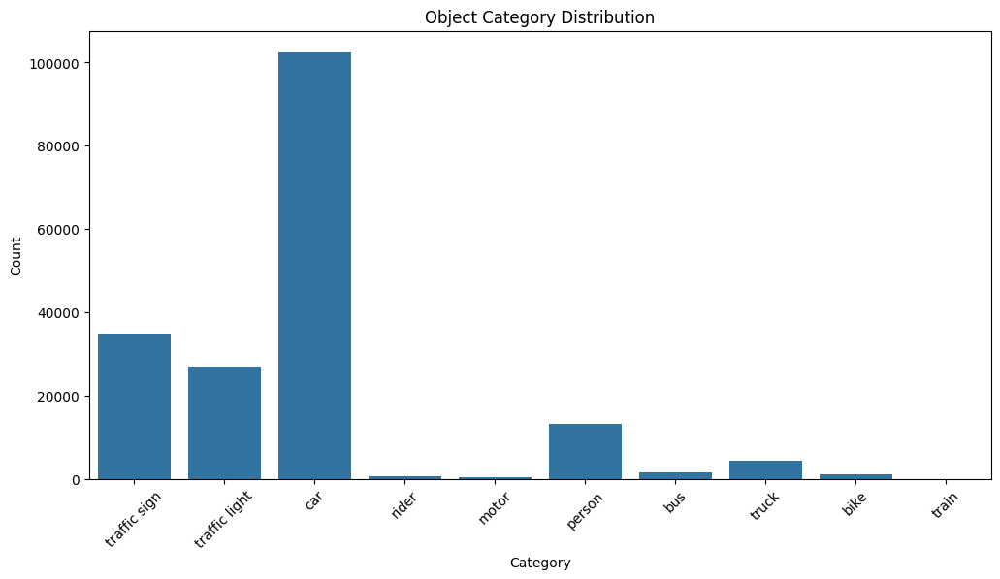

In [3]:
# Count object categories
category_counts = Counter()

for item in data:
    for label in item["labels"]:
        category_counts[label["category"]] += 1

print(category_counts)

# Plot category distribution
plt.figure(figsize=(12, 6))
sns.barplot(x=list(category_counts.keys()), y=list(category_counts.values()))
plt.xticks(rotation=45)
plt.title("Object Category Distribution")
plt.ylabel("Count")
plt.xlabel("Category")
plt.show()


# Environmental Attribute Distribution
Analyze attributes such as weather, time of day, and scene type.

Counter({'clear': 5346, 'overcast': 1239, 'undefined': 1157, 'snowy': 769, 'rainy': 738, 'partly cloudy': 738, 'foggy': 13})
Counter({'daytime': 5258, 'night': 3929, 'dawn/dusk': 778, 'undefined': 35})
Counter({'city street': 6112, 'highway': 2499, 'residential': 1253, 'undefined': 53, 'parking lot': 49, 'tunnel': 27, 'gas stations': 7})


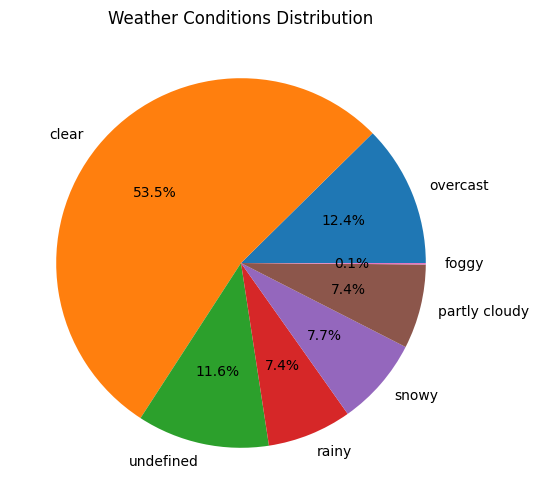

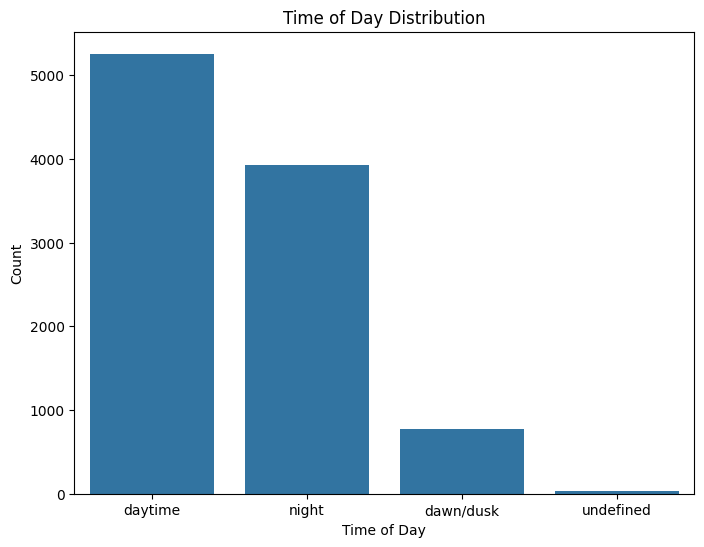

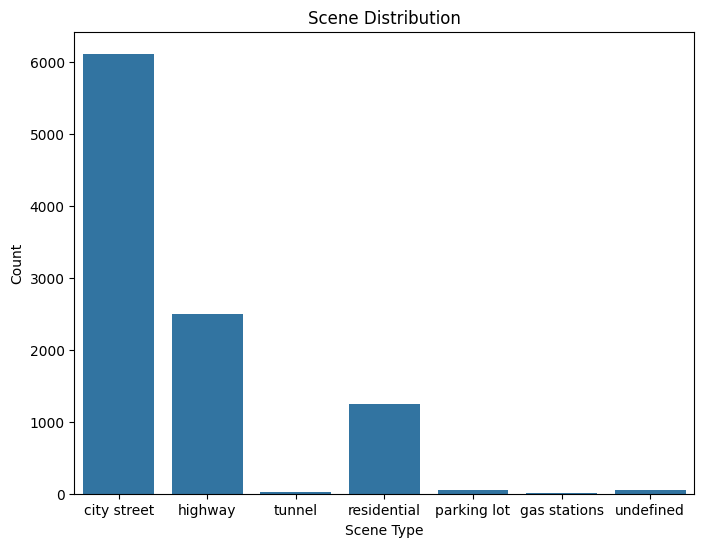

In [4]:
# Count environmental attributes
weather_counts = Counter()
timeofday_counts = Counter()
scene_counts = Counter()

for item in data:
    weather_counts[item["attributes"]["weather"]] += 1
    timeofday_counts[item["attributes"]["timeofday"]] += 1
    scene_counts[item["attributes"]["scene"]] += 1

print(weather_counts)
print(timeofday_counts)
print(scene_counts)
# Plot weather distribution
plt.figure(figsize=(8, 6))
plt.pie(weather_counts.values(), labels=weather_counts.keys(), autopct="%1.1f%%")
plt.title("Weather Conditions Distribution")
plt.show()

# Plot time of day
plt.figure(figsize=(8, 6))
sns.barplot(x=list(timeofday_counts.keys()), y=list(timeofday_counts.values()))
plt.title("Time of Day Distribution")
plt.ylabel("Count")
plt.xlabel("Time of Day")
plt.show()

# Plot time of day
plt.figure(figsize=(8, 6))
sns.barplot(x=list(scene_counts.keys()), y=list(scene_counts.values()))
plt.title("Scene Distribution")
plt.ylabel("Count")
plt.xlabel("Scene Type")
plt.show()

# Bounding Box Statistics
Examine bounding box dimensions and their distributions.

[{'category': 'traffic sign', 'width': 39.92813000000001, 'height': 44.919145000000015}, {'category': 'traffic sign', 'width': 59.89219400000002, 'height': 57.39668500000002}, {'category': 'traffic sign', 'width': 32.441603999999984, 'height': 28.698343000000023}, {'category': 'traffic sign', 'width': 32.44160499999998, 'height': 12.477540000000033}, {'category': 'traffic light', 'width': 8.734278000000018, 'height': 16.22080299999999}, {'category': 'traffic light', 'width': 9.982032000000004, 'height': 21.21181899999999}, {'category': 'traffic light', 'width': 12.477539999999976, 'height': 17.468556999999976}, {'category': 'traffic sign', 'width': 38.68037599999997, 'height': 13.72529400000002}, {'category': 'traffic sign', 'width': 11.229786000000018, 'height': 11.229787999999985}, {'category': 'car', 'width': 76.11299600000001, 'height': 49.910161000000016}, {'category': 'car', 'width': 82.35176600000001, 'height': 56.148933}, {'category': 'car', 'width': 99.82032400000003, 'height'

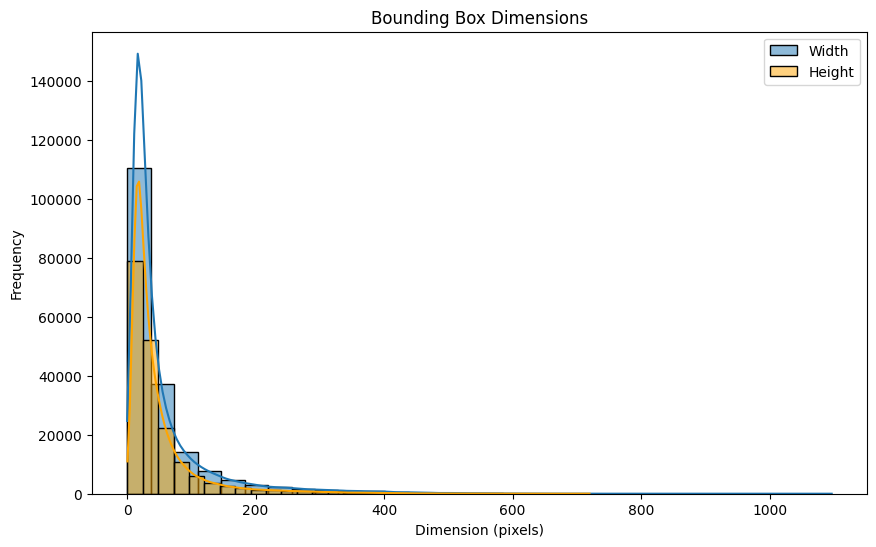

In [5]:
import pandas as pd

# Collect bounding box stats
bbox_data = []
for item in data:
    for label in item["labels"]:
        if "box2d" in label:
            bbox = label["box2d"]
            width = bbox["x2"] - bbox["x1"]
            height = bbox["y2"] - bbox["y1"]
            bbox_data.append({"category": label["category"], "width": width, "height": height})

print(bbox_data)

# Convert to DataFrame
bbox_df = pd.DataFrame(bbox_data)
# Plot bounding box dimensions
plt.figure(figsize=(10, 6))
sns.histplot(bbox_df["width"], kde=True, bins=30, label="Width")
sns.histplot(bbox_df["height"], kde=True, bins=30, label="Height", color="orange")
plt.title("Bounding Box Dimensions")
plt.xlabel("Dimension (pixels)")
plt.ylabel("Frequency")
plt.legend()
plt.show()


# Object Density Heatmaps
Create heatmaps to visualize where objects commonly appear in images.

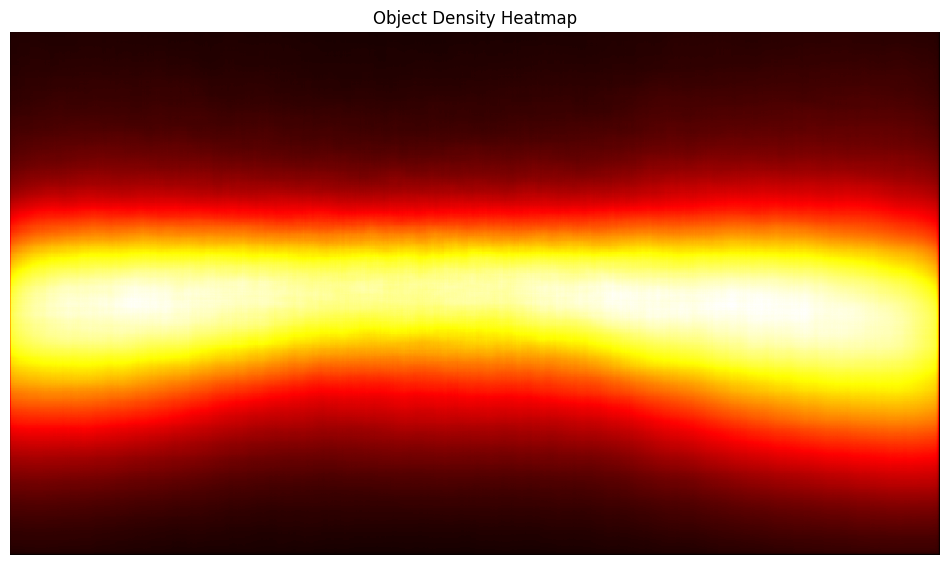

In [6]:
import numpy as np

# Image dimensions (assuming all images are the same size)
img_width, img_height = 1280, 720
heatmap = np.zeros((img_height, img_width))

for item in data:
    for label in item["labels"]:
        if "box2d" in label:
            bbox = label["box2d"]
            x1, y1, x2, y2 = int(bbox["x1"]), int(bbox["y1"]), int(bbox["x2"]), int(bbox["y2"])
            heatmap[y1:y2, x1:x2] += 1

# Normalize heatmap for visualization
heatmap = heatmap / heatmap.max()

# Plot heatmap
plt.figure(figsize=(12, 8))
plt.imshow(heatmap, cmap="hot", interpolation="nearest")
plt.title("Object Density Heatmap")
plt.axis("off")
plt.show()


# Correlation Analysis
Examine how different attributes and categories are related.

Category vs. Environmental Factors

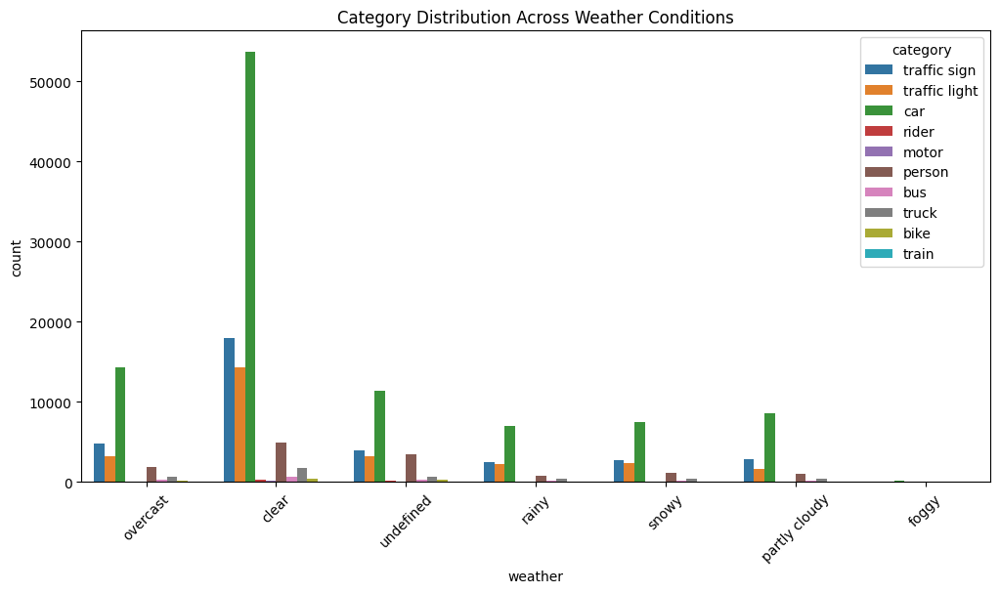

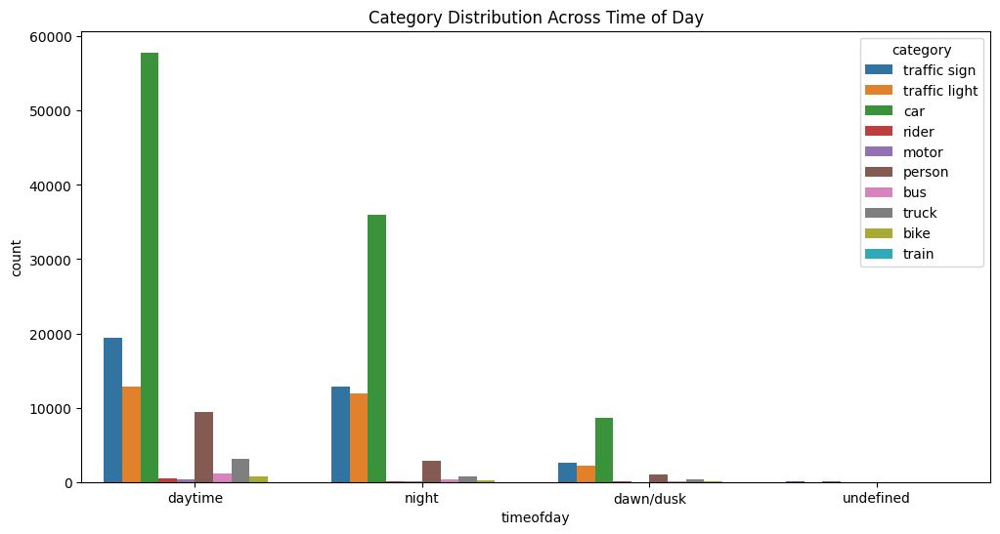

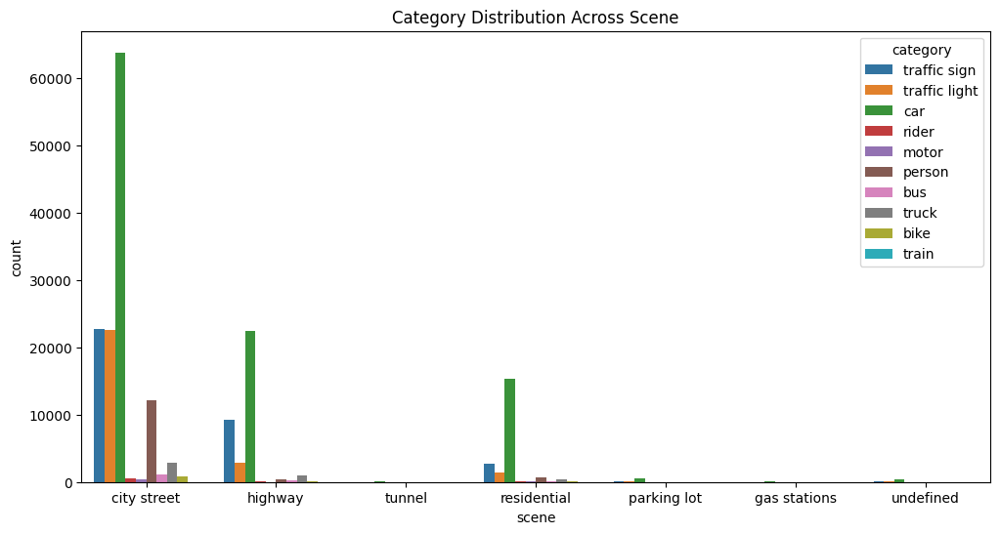

In [7]:
import pandas as pd

# Collect data for correlation
correlation_data = []

for item in data:
    for label in item["labels"]:
        category = label["category"]
        weather = item["attributes"]["weather"]
        timeofday = item["attributes"]["timeofday"]
        scene = item["attributes"]["scene"]
        correlation_data.append({"category": category, "weather": weather, "timeofday": timeofday, "scene": scene})

# Convert to DataFrame
correlation_df = pd.DataFrame(correlation_data)

# Plot category vs weather
plt.figure(figsize=(12, 6))
sns.countplot(x="weather", hue="category", data=correlation_df)
plt.title("Category Distribution Across Weather Conditions")
plt.xticks(rotation=45)
plt.show()

# Plot category vs time of day
plt.figure(figsize=(12, 6))
sns.countplot(x="timeofday", hue="category", data=correlation_df)
plt.title("Category Distribution Across Time of Day")
plt.show()

# Plot category vs Scene
plt.figure(figsize=(12, 6))
sns.countplot(x="scene", hue="category", data=correlation_df)
plt.title("Category Distribution Across Scene")
plt.show()


# Annotation Quality Analysis
Analyze annotation quality by identifying anomalies such as extremely small bounding boxes.

Number of small bounding boxes: 646
           category      width    height       area
489   traffic light   5.491524  8.786439  48.250941
987             car  11.975355  2.993838  35.852273
995             car   1.995892  9.979463  19.917930
1004          motor   8.981514  4.989731  44.815339
1005          motor   9.979459  4.989731  49.794816


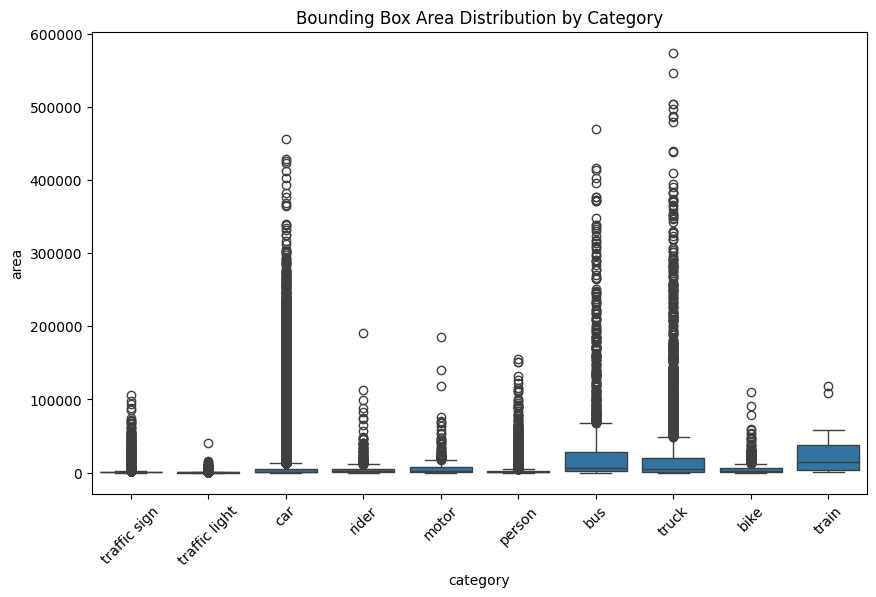

In [8]:
# Detect small bounding boxes
bbox_df["area"] = bbox_df["width"] * bbox_df["height"]
small_bboxes = bbox_df[bbox_df["area"] < 50]  # Threshold for small bounding boxes

print(f"Number of small bounding boxes: {len(small_bboxes)}")
print(small_bboxes.head())

# Plot distribution of bounding box areas
plt.figure(figsize=(10, 6))
sns.boxplot(x="category", y="area", data=bbox_df)
plt.title("Bounding Box Area Distribution by Category")
plt.xticks(rotation=45)
plt.show()


# Object Co-Occurrence
Analyze which object categories often appear together.

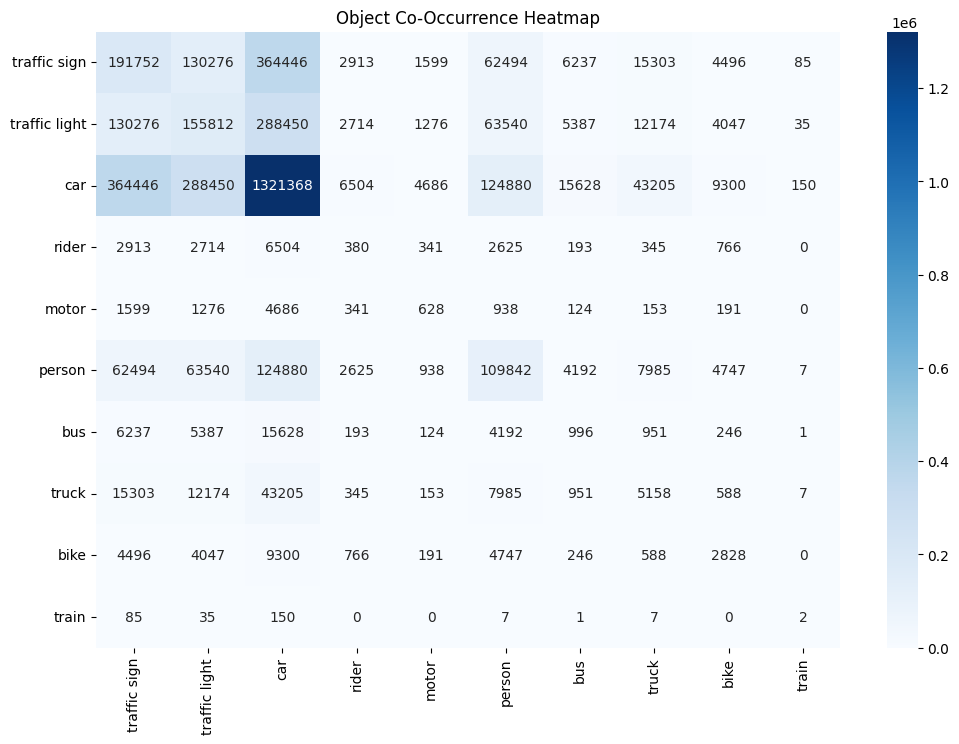

In [9]:
from itertools import combinations

# Create co-occurrence matrix
categories = list(category_counts.keys())
co_occurrence = {category: Counter() for category in categories}

for item in data:
    image_categories = []
    for label in item["labels"]:
        if 'box2d' not in label:
            continue
        image_categories.append(label["category"])
    for cat1, cat2 in combinations(image_categories, 2):
        co_occurrence[cat1][cat2] += 1
        co_occurrence[cat2][cat1] += 1

# Convert to a DataFrame
co_occurrence_df = pd.DataFrame(co_occurrence).fillna(0)

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(co_occurrence_df, annot=True, fmt=".0f", cmap="Blues", xticklabels=True, yticklabels=True)
plt.title("Object Co-Occurrence Heatmap")
plt.show()


# Temporal Analysis
If the dataset contains time-series data or video sequences, analyze object patterns over time.

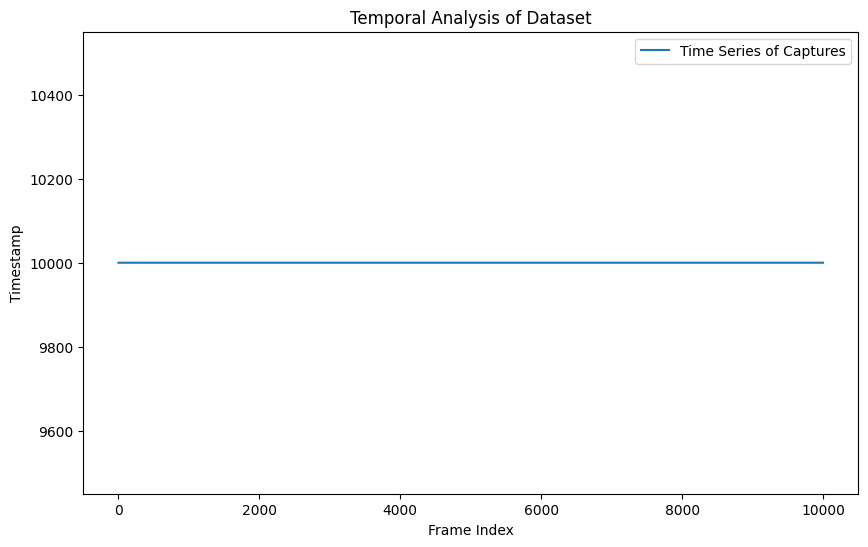

In [10]:
# Extract timestamps
timestamps = [item["timestamp"] for item in data if "timestamp" in item]
timestamps.sort()

# Plot object frequency over time
plt.figure(figsize=(10, 6))
plt.plot(range(len(timestamps)), timestamps, label="Time Series of Captures")
plt.title("Temporal Analysis of Dataset")
plt.xlabel("Frame Index")
plt.ylabel("Timestamp")
plt.legend()
plt.show()


# Advanced Spatial Heatmaps
Visualize spatial patterns per object category.

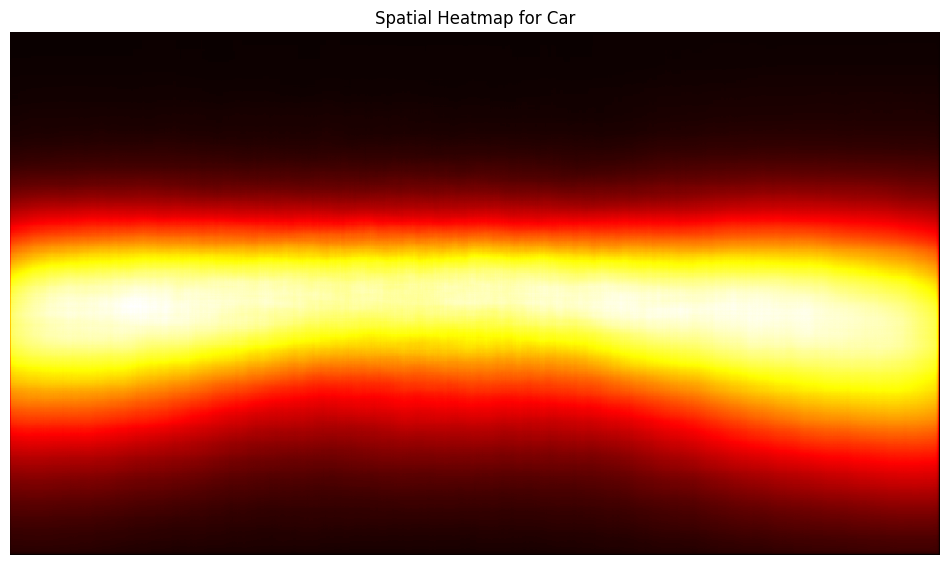

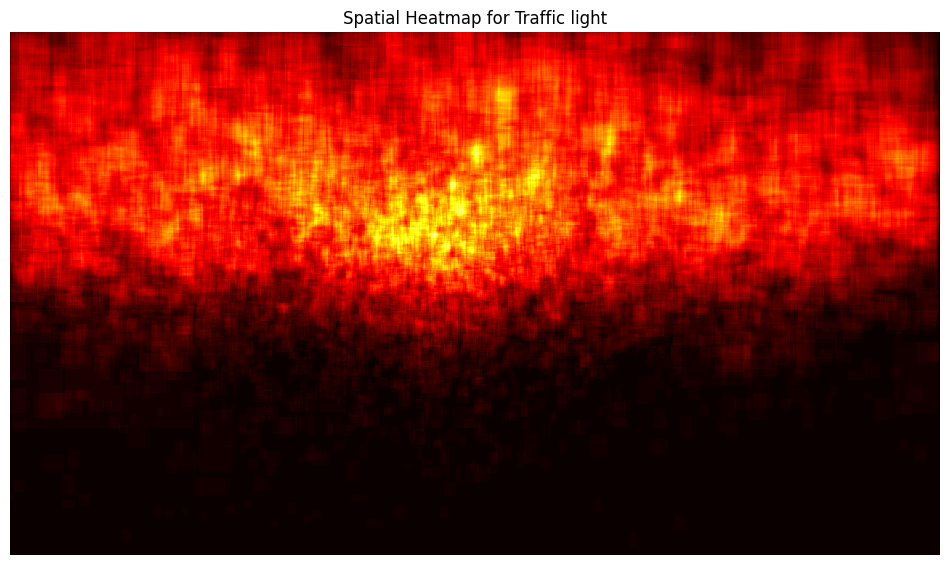

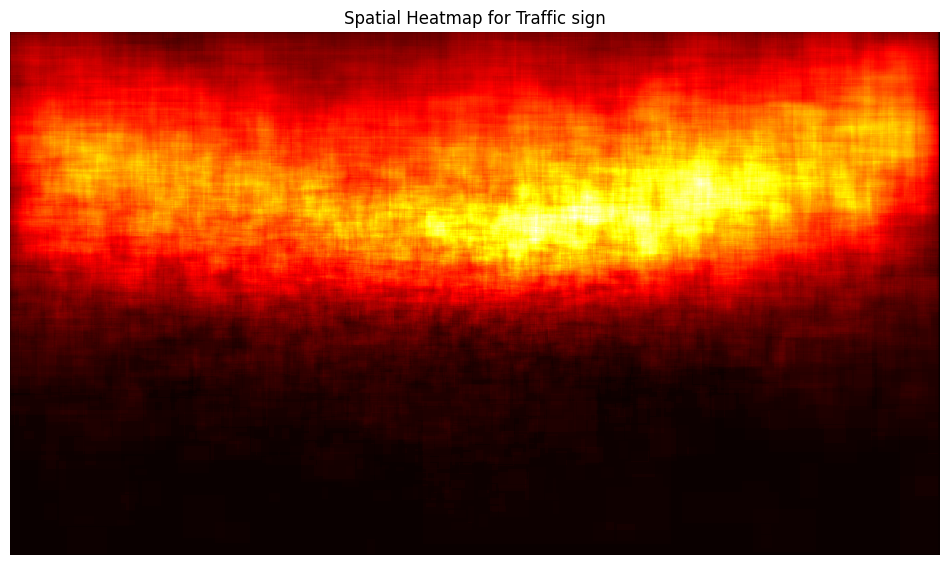

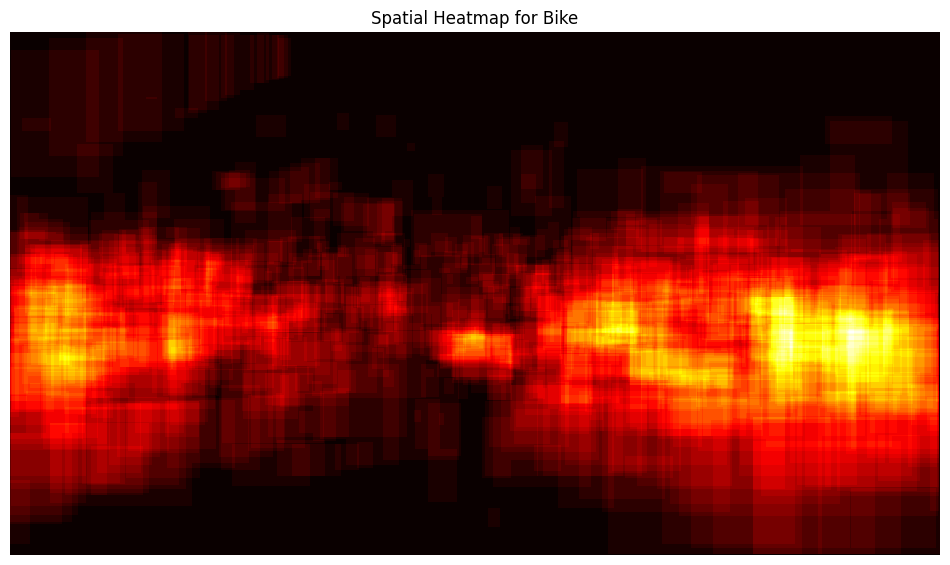

In [11]:
category_heatmaps = {category: np.zeros((img_height, img_width)) for category in categories}

for item in data:
    for label in item["labels"]:
        if "box2d" in label:
            bbox = label["box2d"]
            x1, y1, x2, y2 = int(bbox["x1"]), int(bbox["y1"]), int(bbox["x2"]), int(bbox["y2"])
            category_heatmaps[label["category"]][y1:y2, x1:x2] += 1

# Normalize and visualize heatmaps for a few categories
for category in ["car", "traffic light", "traffic sign", "bike"]:
    heatmap = category_heatmaps[category] / category_heatmaps[category].max()
    plt.figure(figsize=(12, 8))
    plt.imshow(heatmap, cmap="hot", interpolation="nearest")
    plt.title(f"Spatial Heatmap for {category.capitalize()}")
    plt.axis("off")
    plt.show()


# Anomaly Detection in Bounding Boxes
Identify unusual bounding boxes based on dimensions and positions using Isolation Forest.

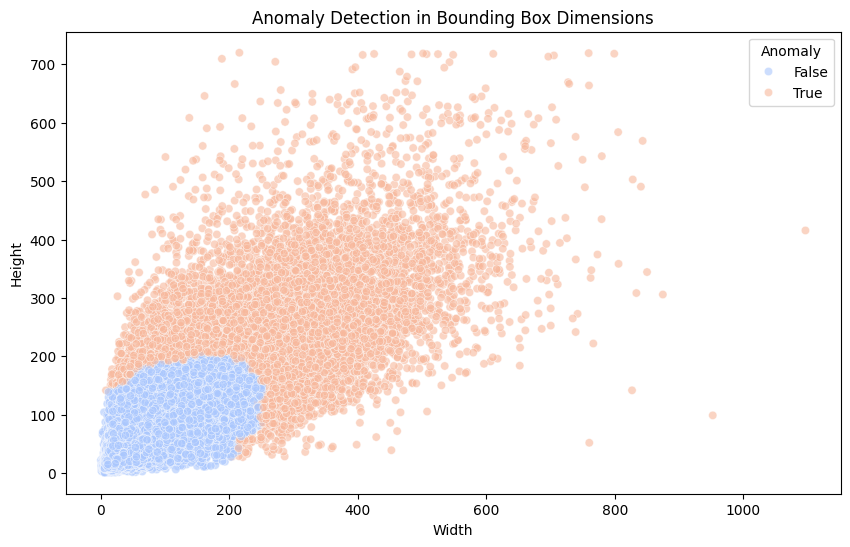

In [12]:
from sklearn.ensemble import IsolationForest

# Prepare bounding box data
bbox_features = bbox_df[["width", "height"]].values

# Apply Isolation Forest
iso_forest = IsolationForest(contamination=0.05, random_state=42)
anomalies = iso_forest.fit_predict(bbox_features)

# Highlight anomalies
bbox_df["is_anomaly"] = anomalies == -1

# Plot anomalies
plt.figure(figsize=(10, 6))
sns.scatterplot(data=bbox_df, x="width", y="height", hue="is_anomaly", palette="coolwarm", alpha=0.6)
plt.title("Anomaly Detection in Bounding Box Dimensions")
plt.xlabel("Width")
plt.ylabel("Height")
plt.legend(title="Anomaly")
plt.show()


# Advanced Spatial Analytics with Object Hotspots
Analyze hotspot regions for specific categories across all images.

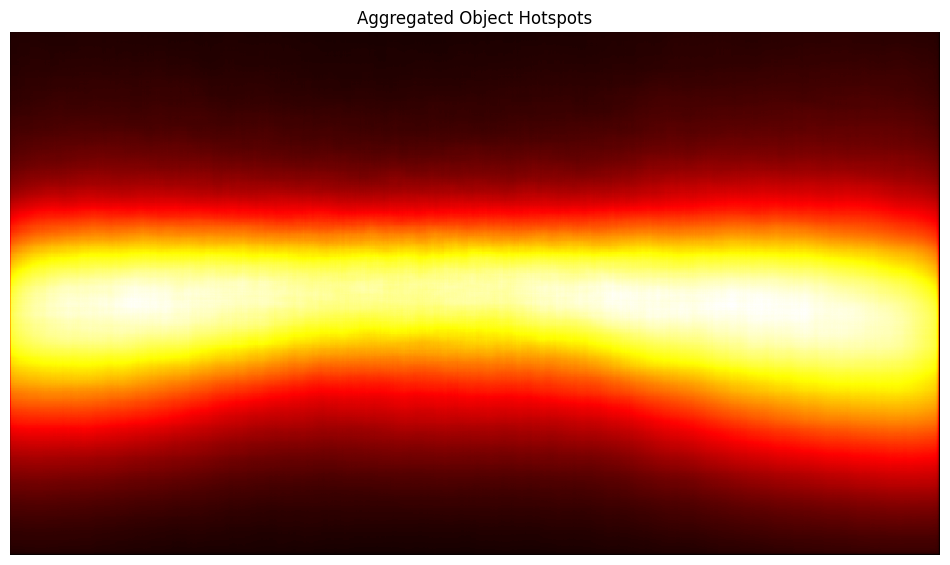

In [13]:
category_heatmaps_advanced = {category: np.zeros((img_height, img_width)) for category in categories}

for item in data:
    for label in item["labels"]:
        if "box2d" in label:
            bbox = label["box2d"]
            x1, y1, x2, y2 = int(bbox["x1"]), int(bbox["y1"]), int(bbox["x2"]), int(bbox["y2"])
            category_heatmaps_advanced[label["category"]][y1:y2, x1:x2] += 1

# Aggregate heatmaps for hotspot analysis
hotspot = sum(category_heatmaps_advanced.values())
hotspot = hotspot / hotspot.max()

# Plot hotspots
plt.figure(figsize=(12, 8))
plt.imshow(hotspot, cmap="hot", interpolation="nearest")
plt.title("Aggregated Object Hotspots")
plt.axis("off")
plt.show()


# Object Density Over Environmental Factors
Combine spatial and environmental data to analyze density changes under different conditions.

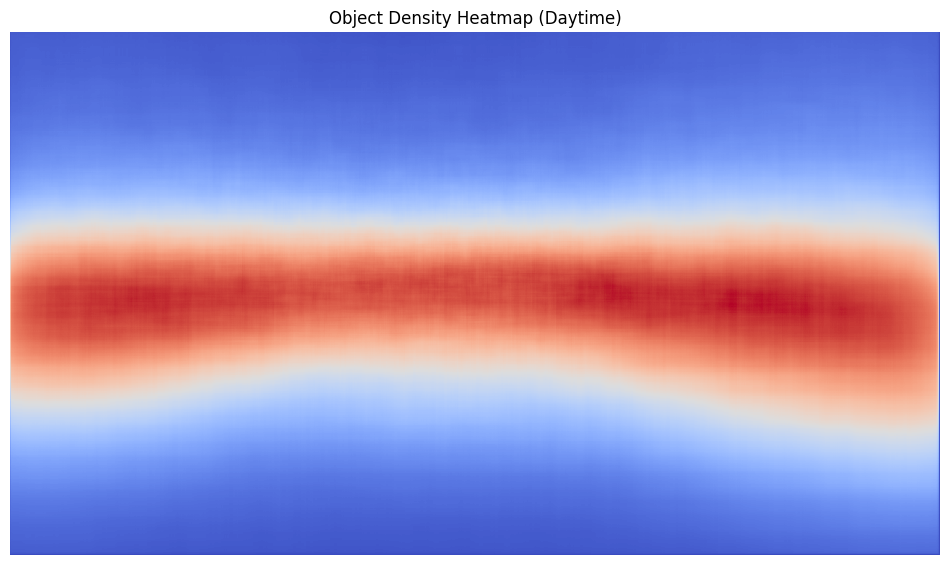

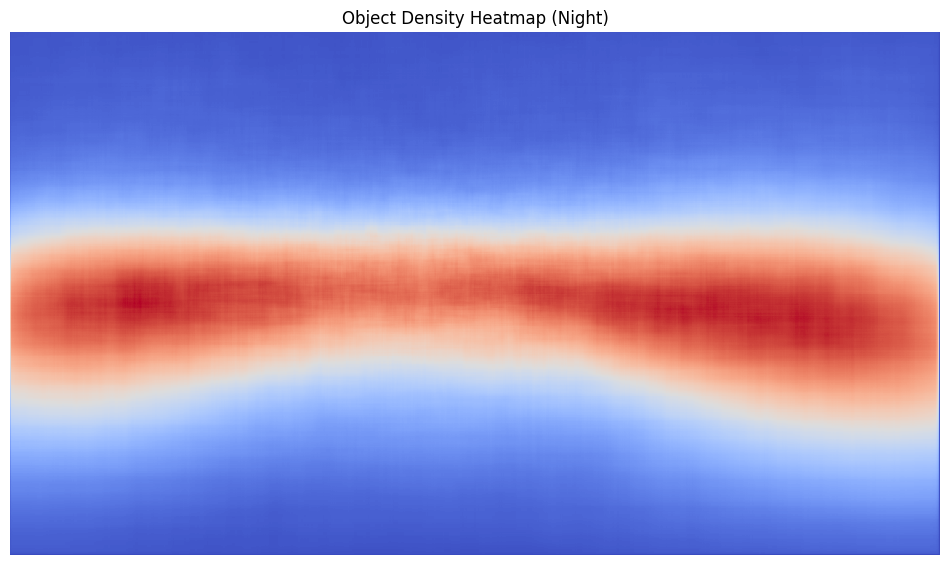

In [14]:
for condition in ["daytime", "night"]:
    heatmap_condition = np.zeros((img_height, img_width))
    for item in data:
        if item["attributes"]["timeofday"] == condition:
            for label in item["labels"]:
                if "box2d" in label:
                    bbox = label["box2d"]
                    x1, y1, x2, y2 = int(bbox["x1"]), int(bbox["y1"]), int(bbox["x2"]), int(bbox["y2"])
                    heatmap_condition[y1:y2, x1:x2] += 1
    heatmap_condition = heatmap_condition / heatmap_condition.max()
    
    plt.figure(figsize=(12, 8))
    plt.imshow(heatmap_condition, cmap="coolwarm", interpolation="nearest")
    plt.title(f"Object Density Heatmap ({condition.capitalize()})")
    plt.axis("off")
    plt.show()


# Automated Data Quality Assessment
Detect missing or inconsistent labels.

In [15]:
# Check for missing labels
missing_labels = [item for item in data if len(item["labels"]) == 0]
print(f"Number of images with missing labels: {len(missing_labels)}")

# Inspect inconsistent bounding boxes
invalid_bboxes = bbox_df[(bbox_df["width"] <= 0) | (bbox_df["height"] <= 0)]
print(f"Number of invalid bounding boxes: {len(invalid_bboxes)}")


Number of images with missing labels: 0
Number of invalid bounding boxes: 0
